# Short Term Water Demand Forecasting with Statistical and AI Methods

### Oscar Wooding
Department of Civil and Environmental Engineering, Imperial College London

### Initial Statistical Analysis


In [1]:
# imports 
import sys
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib import rc
import matplotlib_inline
import datetime as dt
import warnings
from scipy import stats

from sklearn.impute import KNNImputer
from statsmodels.tsa.seasonal import MSTL

# imports for time series analysis
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.ar_model import AutoReg, ar_select_order

# box-cox transformation for skeewed data
from scipy.stats import boxcox
from scipy.special import inv_boxcox

%matplotlib inline

pd.options.display.float_format = "{:,.2f}".format
np.set_printoptions(precision=2)

# improve matlab output
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

rc('text', usetex=False)
plt.rc('font', size=10)          # controls default text sizes
plt.rc('axes', titlesize=12)     # fontsize of the axes title
plt.rc('axes', labelsize=11)     # fontsize of the x and y labels
plt.rc('xtick', labelsize=10)    # fontsize of the tick labels
plt.rc('ytick', labelsize=10)    # fontsize of the tick labels
plt.rc('legend', fontsize=10)    # legend fontsize
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

# adjust the format of the data set
pd.options.display.float_format = '{:,.2f}'.format
np.set_printoptions(precision=2)

warnings.filterwarnings("ignore")


### *Load*

In [22]:
# load inflow data
inflow_data = pd.read_csv("../data/InflowDataImputed.csv")

# make list with dma names
dma_list = list(inflow_data.columns.values[1:])

# male list with dma description
dma_descripton = ["Hospital district",
                   "Residential district in the countryside",
                   "Residential district in the countryside",
                   "Suburban residential/commercial district",
                   "Residential/commercial district close to the city centre",
                   "Suburban district including sport facilities and office buildings",
                   "Residential district close to the city centre",
                   "City centre district",
                   "Commercial/industrial district close to the port",
                   "Commercial/industrial district close to the port"]

# make list with information of users supplied
users_supplied = [162,531,607,2094,7955,1135,3180,2901,425,776]

# make list with average net inflow
av_net_inflo = [8.4,9.6,4.3,32.9,78.3,8.1,25.1,20.8,20.6,26.4]

inflow_data = inflow_data.set_index('date_time')

# change index format to datetime
inflow_data.index = pd.to_datetime(inflow_data.index, format="mixed")

dmas = list(inflow_data.columns)

# # print first two rows
inflow_data.head(3)


,dma_a,dma_b,dma_c,dma_d,dma_e,dma_f,dma_g,dma_h,dma_i,dma_j
date_time,,,,,,,,,,
2021-01-01 00:00:00,5.58,8.02,3.70,25.61,60.72,6.67,18.91,13.86,17.68,21.55
2021-01-01 01:00:00,5.19,7.65,3.56,24.07,56.11,6.49,16.60,12.42,17.25,20.78
2021-01-01 02:00:00,7.27,7.65,3.27,23.86,53.80,6.21,15.43,10.95,16.84,20.45


In [8]:
# load weather data
weather_data = pd.read_csv("../data/WeatherDataImputed.csv")

weather_data = weather_data.set_index('date_time')

# change index format to datetime
weather_data.index = pd.to_datetime(weather_data.index, format="mixed")

# # print first two rows
weather_data.head(3)


,rain_depth,air_temp,air_humid,windspeed
date_time,,,,
2021-01-01 00:00:00,0.00,7.20,79.00,9.00
2021-01-01 01:00:00,0.00,7.30,79.00,6.00
2021-01-01 02:00:00,0.00,7.60,78.00,4.00


### *Visualise*

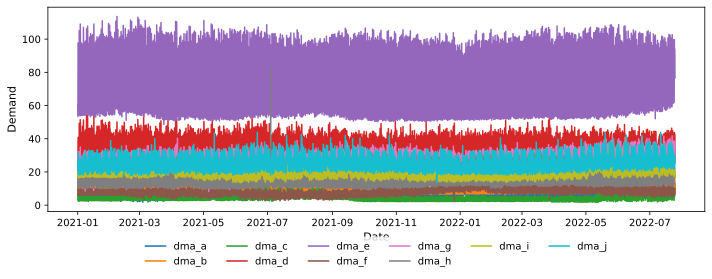

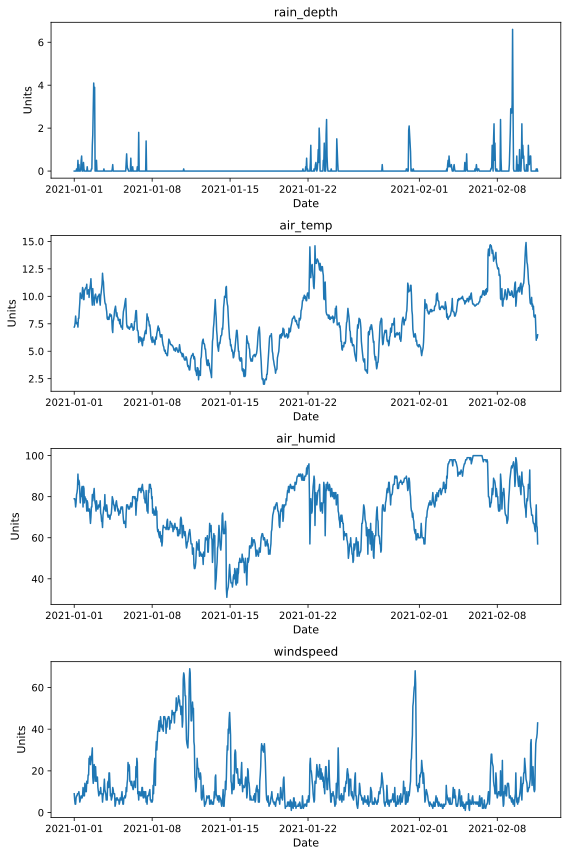

In [9]:
# total dataset
# demand
no_timesteps, no_dma = inflow_data.shape

fig, axs = plt.subplots(1, 1, figsize=(10, 4))

axs.plot(inflow_data, label=inflow_data.columns)
axs.set_xlabel('Date')
axs.set_ylabel('Demand')

leg = axs.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1),
    fancybox=False, shadow=False, ncol=6, edgecolor='w', borderpad=0.5)
leg.get_frame().set_linewidth(0.5)

fig.tight_layout()
plt.show()

# weather
fig, axs = plt.subplots(4, 1, figsize=(8, 12))

for i, col in enumerate(weather_data.columns): 
    axs[i].plot(weather_data.iloc[0:1000, :][col], label=col)
    axs[i].set_title(col)
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Units')

fig.tight_layout()
plt.show()


### Data Analysis

#### 0. Statistical Properties

In [25]:
# basic statistical properties
stats = {dma: {} for dma in dmas}

for i, dma in enumerate(dmas): 
    stats[dma]['readings'] = len(inflow_data[dma])
    stats[dma]['min_demand'] = inflow_data[dma].min()
    stats[dma]['quartile_lower'] = np.percentile(inflow_data[dma], 25)
    stats[dma]['median'] = np.percentile(inflow_data[dma], 50)
    stats[dma]['quartile_upper'] = np.percentile(inflow_data[dma], 75)
    stats[dma]['max_demand'] = inflow_data[dma].max()
    stats[dma]['std'] = inflow_data[dma].std()
    stats[dma]['mode'] = inflow_data[dma].mode()
    stats[dma]['mean'] = inflow_data[dma].mean()
    stats[dma]['skewness'] = inflow_data.skew()
    stats[dma]['kurtosis'] = inflow_data.kurt()
    stats[dma]['dma_type'] = dma_descripton[i]
    stats[dma]['users_supplied'] = users_supplied[i]

stats

{'dma_a': {'readings': 13679,
  'min_demand': 1.83,
  'quartile_lower': 6.39,
  'median': 8.33,
  'quartile_upper': 10.28,
  'max_demand': 29.75,
  'std': 2.8126810433694778,
  'mode': 0   8.07
  Name: dma_a, dtype: float64,
  'mean': 8.39945500900685,
  'skewness': dma_a    0.63
  dma_b    1.08
  dma_c    0.92
  dma_d   -0.22
  dma_e   -0.31
  dma_f    0.30
  dma_g   -0.21
  dma_h   -0.09
  dma_i    0.81
  dma_j    0.26
  dtype: float64,
  'kurtosis': dma_a    2.56
  dma_b    1.93
  dma_c    1.29
  dma_d   -0.66
  dma_e   -0.97
  dma_f    0.04
  dma_g   -0.50
  dma_h    0.86
  dma_i    1.30
  dma_j   -0.71
  dtype: float64,
  'dma_type': 'Hospital district'},
 'dma_b': {'readings': 13679,
  'min_demand': 6.27,
  'quartile_lower': 8.32,
  'median': 9.29,
  'quartile_upper': 10.55,
  'max_demand': 21.02,
  'std': 1.8522566382502066,
  'mode': 0   8.84
  Name: dma_b, dtype: float64,
  'mean': 9.569874912542678,
  'skewness': dma_a    0.63
  dma_b    1.08
  dma_c    0.92
  dma_d   -0.22
 

#### 1. Correlation

In [5]:
# correlation between different dma
lagged_inflow_data = inflow_data.copy()
for i in np.arange(1, 25): 
    for col in inflow_data.iloc[:, :10]: 
        label = col + '_+' + str(i)
        lagged_inflow_data[label] = inflow_data[col].shift(i)
    
inflow_data.corr()


,dma_a,dma_b,dma_c,dma_d,dma_e,dma_f,dma_g,dma_h,dma_i,dma_j
dma_a,1.00,0.57,0.60,0.41,0.53,0.07,0.56,0.54,0.45,0.63
dma_b,0.57,1.00,0.90,0.63,0.68,0.12,0.65,0.54,0.35,0.55
dma_c,0.60,0.90,1.00,0.63,0.70,0.16,0.70,0.56,0.33,0.55
dma_d,0.41,0.63,0.63,1.00,0.90,0.55,0.79,0.81,0.40,0.63
dma_e,0.53,0.68,0.70,0.90,1.00,0.55,0.90,0.92,0.53,0.76
dma_f,0.07,0.12,0.16,0.55,0.55,1.00,0.57,0.58,0.24,0.37
dma_g,0.56,0.65,0.70,0.79,0.90,0.57,1.00,0.85,0.46,0.71
dma_h,0.54,0.54,0.56,0.81,0.92,0.58,0.85,1.00,0.61,0.83
dma_i,0.45,0.35,0.33,0.40,0.53,0.24,0.46,0.61,1.00,0.85
dma_j,0.63,0.55,0.55,0.63,0.76,0.37,0.71,0.83,0.85,1.00


In [6]:
# correlation between different dma and their lag
c = lagged_inflow_data.corr()

high_corr = {}
thresh = 0.8  # threshold value of correlation for printed output

for row in c.columns: 
    for col in c.columns: 
        if (row != col)and (row[-3:] != col[-3:])and(row[-3]!='+' or row[-3]!='+')and(row[-2]!='+' or row[-2]!='+'): 
            if c.loc[row, col] > thresh:
                key = (row, col)
                high_corr[key] = c.loc[row, col]

high_corr


{('dma_a', 'dma_a_+1'): 0.8041220946987527,
 ('dma_b', 'dma_c'): 0.9044201833170077,
 ('dma_b', 'dma_b_+1'): 0.9085731002735484,
 ('dma_b', 'dma_c_+1'): 0.8332603121983394,
 ('dma_b', 'dma_b_+23'): 0.8354152412091046,
 ('dma_b', 'dma_b_+24'): 0.8997555362369851,
 ('dma_b', 'dma_c_+24'): 0.8539036725310911,
 ('dma_c', 'dma_b'): 0.9044201833170077,
 ('dma_c', 'dma_b_+1'): 0.8385681456330186,
 ('dma_c', 'dma_c_+1'): 0.9011624294578765,
 ('dma_c', 'dma_c_+23'): 0.8210704484797399,
 ('dma_c', 'dma_b_+24'): 0.8543960709999636,
 ('dma_c', 'dma_c_+24'): 0.8943913916018679,
 ('dma_d', 'dma_e'): 0.8991029753150251,
 ('dma_d', 'dma_h'): 0.8138697733158547,
 ('dma_d', 'dma_d_+1'): 0.828845844906137,
 ('dma_d', 'dma_e_+23'): 0.8008156009481721,
 ('dma_d', 'dma_d_+24'): 0.8614303034811542,
 ('dma_d', 'dma_e_+24'): 0.8683925561663697,
 ('dma_d', 'dma_h_+24'): 0.8091669550398045,
 ('dma_e', 'dma_d'): 0.8991029753150251,
 ('dma_e', 'dma_g'): 0.9027676149380383,
 ('dma_e', 'dma_h'): 0.9156566498429051,


In [7]:
# correlation between external factors
weather_data.corr()


,rain_depth,air_temp,air_humid,windspeed
rain_depth,1.00,-0.02,0.15,0.04
air_temp,-0.02,1.00,-0.22,-0.11
air_humid,0.15,-0.22,1.00,-0.32
windspeed,0.04,-0.11,-0.32,1.00


In [8]:
# plotting demand correlation to prior timesteps of importance
import random

fig, axs = plt.subplots(10, 3, figsize=(12, 24))

lags = [1, 24, 24*7]

fig.suptitle('Correlation between demand at t, t-1, t-24, and t-24*7 ', fontsize=12, y=1)

for i, dma in enumerate(inflow_data.iloc[:, :10].columns):
    for j, lag in enumerate(lags): 
        
        data = inflow_data.dropna()[0:3000]
        
        sample = pd.DataFrame()
        sample['x'] = data[dma]
        sample['y'] = data.shift(lag)[dma]
        sample = sample.dropna()
        
        # Plotting the histogram.
        axs[i][j].scatter(sample['x'], sample['y'], s=60, alpha=0.7, edgecolors="k")
        
        # get correlation
        corr = np.corrcoef(sample['x'], sample['y'])[0][1]

        # Fit linear regression via least squares with numpy.polyfit
        # It returns an slope (b) and intercept (a)
        # deg=1 means linear fit (i.e. polynomial of degree 1)
        b, a = np.polyfit(sample['x'], sample['y'], deg=1)
        
        xmin, xmax = 0, inflow_data[dma].max() * 1.2
        
        # Create sequence of 100 numbers from 0 to 100 
        xseq = np.linspace(xmin, xmax, num=100)

        # Plot regression line
        axs[i][j].plot(xseq, a + b * xseq, color="k", lw=1);
    
        axs[i][j].set_title(dma + ' : corr ' + repr(corr)[:3] + ': t-' + str(lag))
        axs[i][j].set_xlabel('demand')
        axs[i][j].set_ylabel('frequency density')

fig.tight_layout()
plt.show()


#### 1.1 Comments on Correlation

- 
- 

#### 2. Averaging

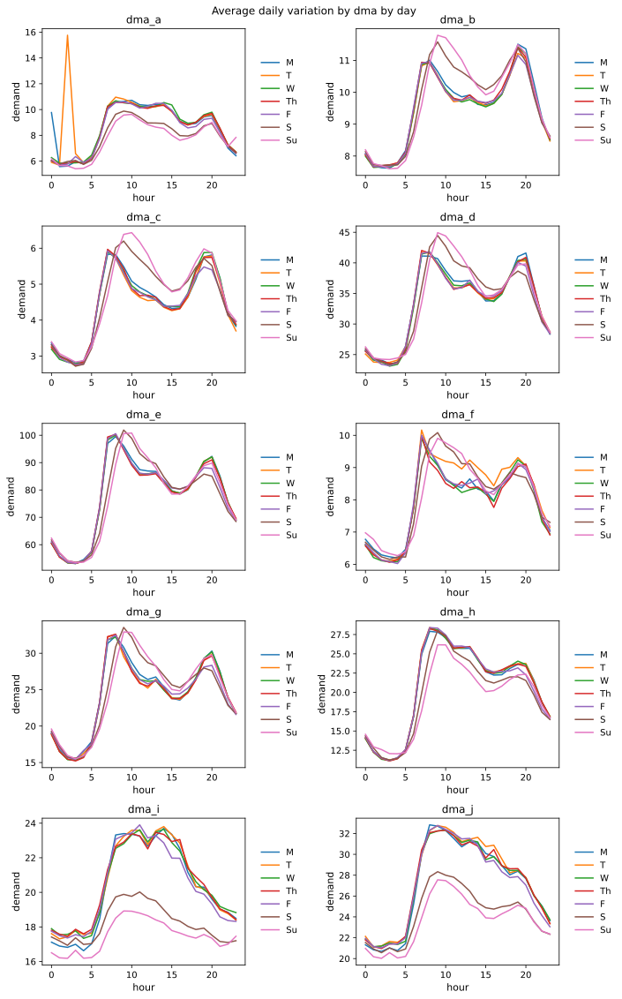

In [9]:
# plotting weekday averages
inflow_data['day'] = inflow_data.index.weekday
inflow_data['hour'] = inflow_data.index.hour

days = ['M', 'T', 'W', 'Th', 'F', 'S', 'Su']

fig, axs = plt.subplots(5, 2, figsize=(10, 16))
axs = axs.flatten()

fig.suptitle('Average daily variation by dma by day', fontsize=12)

for i, dma in enumerate(inflow_data.iloc[:, :10].columns):
    for day in np.arange(7): 
        axs[i].plot(inflow_data[inflow_data['day']==day].groupby(by='hour').mean()[dma], label=days[day])
        axs[i].set_title(dma)
        axs[i].set_xlabel('hour')
        axs[i].set_ylabel('demand')
        leg = axs[i].legend(loc='right', bbox_to_anchor=(1.3, 0.5),
            fancybox=False, shadow=False, ncol=1, edgecolor='w', borderpad=0.5)
        leg.get_frame().set_linewidth(0.5)

fig.tight_layout()
plt.show()


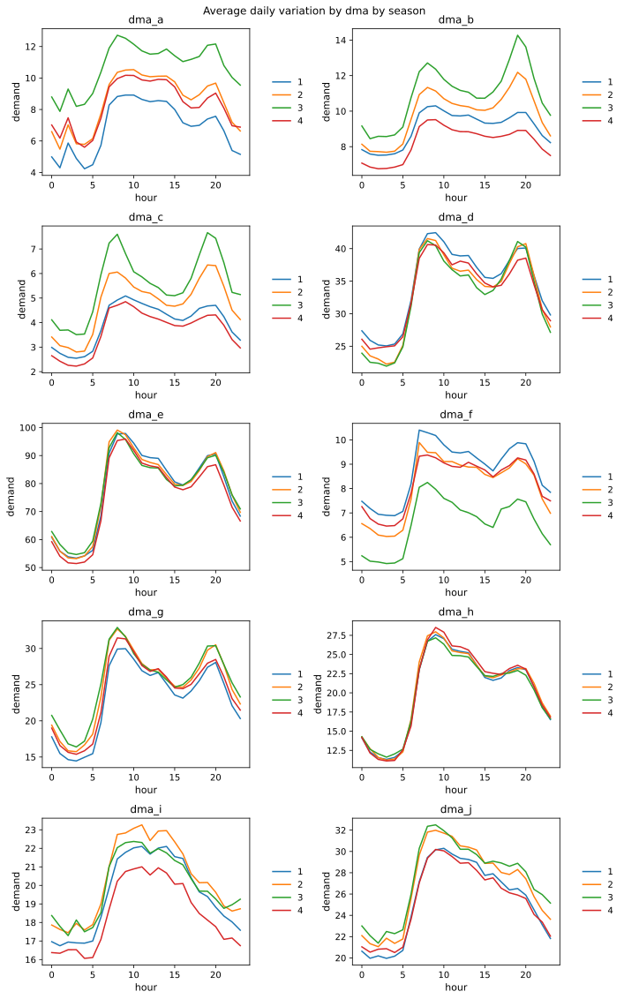

In [10]:
# plotting seasonal variation
inflow_data['season'] = inflow_data.index.quarter

fig, axs = plt.subplots(5, 2, figsize=(10, 16))
axs = axs.flatten()

fig.suptitle('Average daily variation by dma by season', fontsize=12)

for i, dma in enumerate(inflow_data.iloc[:, :10].columns):
    for season in np.arange(4): 
        axs[i].plot(inflow_data[inflow_data['season']==season+1].groupby(by='hour').mean()[dma], label=season+1)
        axs[i].set_title(dma)
        axs[i].set_xlabel('hour')
        axs[i].set_ylabel('demand')
        leg = axs[i].legend(loc='right', bbox_to_anchor=(1.3, 0.5),
            fancybox=False, shadow=False, ncol=1, edgecolor='w', borderpad=0.5)
        leg.get_frame().set_linewidth(0.5)

fig.tight_layout()
plt.show()


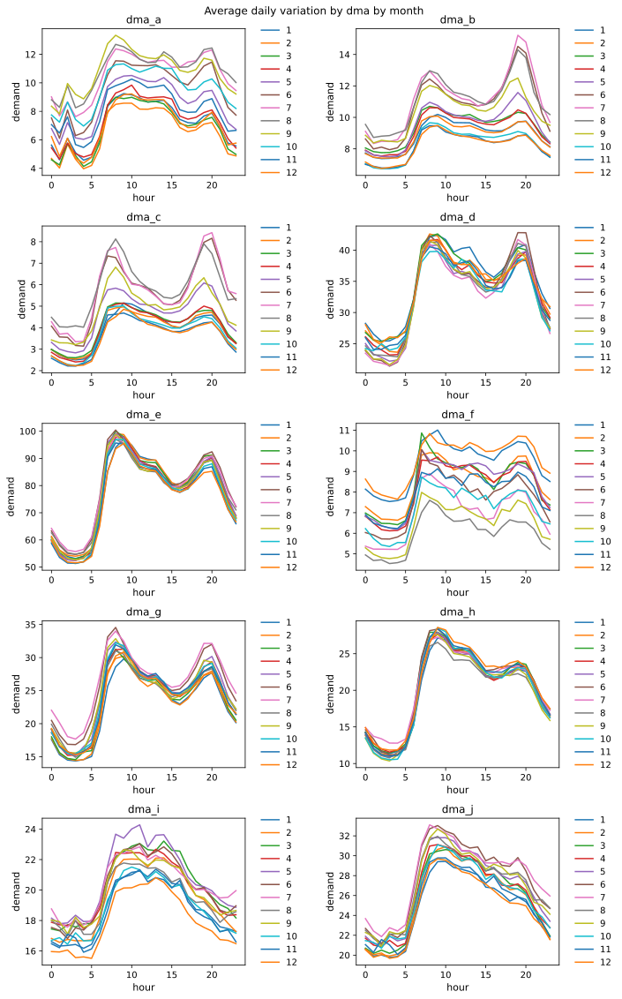

In [11]:
# plotting monthly variation
inflow_data['month'] = inflow_data.index.month

fig, axs = plt.subplots(5, 2, figsize=(10, 16))
axs = axs.flatten()

fig.suptitle('Average daily variation by dma by month', fontsize=12)

for i, dma in enumerate(inflow_data.iloc[:, :10].columns):
    for month in np.arange(12): 
        axs[i].plot(inflow_data[inflow_data['month']==month+1].groupby(by='hour').mean()[dma], label=month+1)
        axs[i].set_title(dma)
        axs[i].set_xlabel('hour')
        axs[i].set_ylabel('demand')
        leg = axs[i].legend(loc='right', bbox_to_anchor=(1.3, 0.5),
            fancybox=False, shadow=False, ncol=1, edgecolor='w', borderpad=0.5)
        leg.get_frame().set_linewidth(0.5)

fig.tight_layout()
plt.show()


#### 3. Distributions

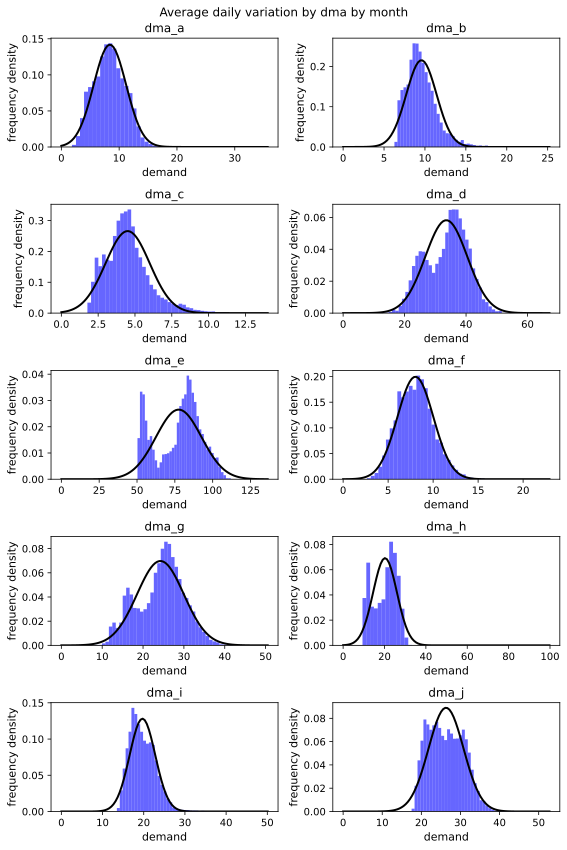

In [12]:
# plotting dma demand distributions vs normal
from scipy.stats import norm

fig, axs = plt.subplots(5, 2, figsize=(8, 12))
axs = axs.flatten()

fig.suptitle('Average daily variation by dma by month', fontsize=12)

for i, dma in enumerate(inflow_data.iloc[:, :10].columns):
    # Plotting the histogram.
    axs[i].hist(inflow_data[dma], bins=40, density=True, alpha=0.6, color='b')
    
    # Fit a normal distribution to
    # the data:
    # mean and standard deviation
    mu, std = norm.fit(inflow_data[dma].dropna(axis=0)) 
    
    # Plot the PDF
    xmin, xmax = 0, inflow_data[dma].max() * 1.2
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)

    axs[i].plot(x, p, 'k', linewidth=2)
    axs[i].set_title(dma)
    axs[i].set_xlabel('demand')
    axs[i].set_ylabel('frequency density')

fig.tight_layout()
plt.show()


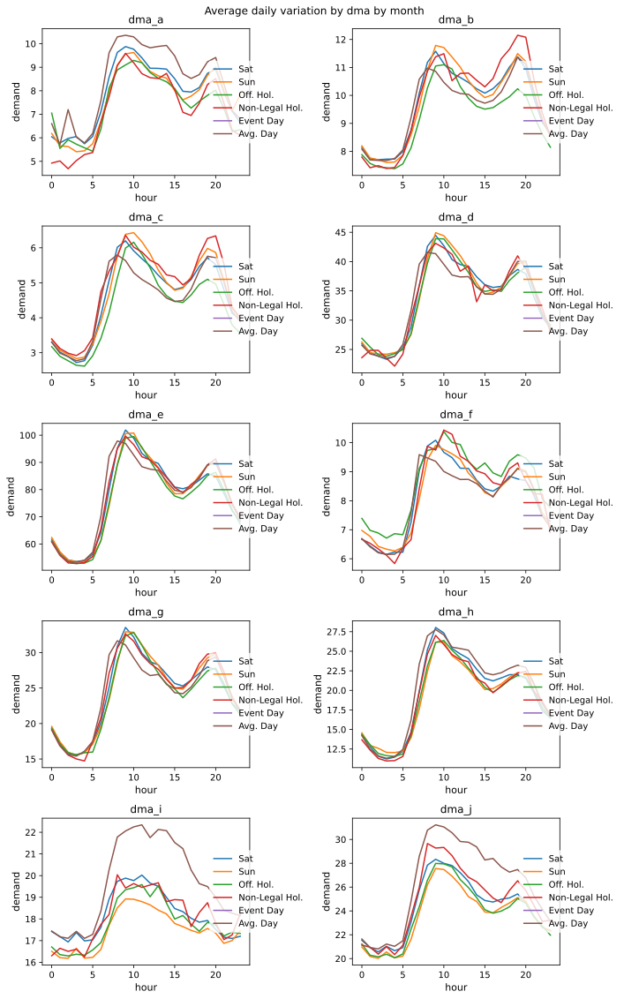

In [13]:
# comparison of weekends and holidays
# make list of special days for the DMAs region
official_holidays = ["2021-01-01","2021-01-06","2021-04-04","2021-04-05","2021-04-25","2021-05-01","2021-06-02","2021-08-15","2021-11-01","2021-12-05","2021-12-25","2021-12-26","2022-01-01","2022-01-06","2022-04-17","2022-04-18","2022-04-25","2022-05-01","2022-06-22","2022-08-15","2022-11-01","2022-12-08","2022-12-25","2022-12-26"]

legally_not_recongnized_holidays = ["2021-04-23","2021-05-23","2022-04-23","2022-06-05"]

event_day = ["2021-03-28","2021-05-09","2021-10-31","2021-11-28","2021-05-12","2021-12-12","2021-12-19","2021-12-31","2022-03-27","2022-04-10","2022-05-08","2022-05-09","2022-10-30","2022-11-27","2022-12-04","2022-12-11","2022-12-18","2022-12-31"]

# make columns for special days
inflow_data['official_holiday'] = 0
inflow_data['legally_not_recongnized_holidays'] = 0
inflow_data['event_day'] = 0
inflow_data['weekend'] = 0

# add indicator variable for speciall days
for i in inflow_data.index:
    if str(i)[:10] in official_holidays:
        inflow_data['official_holiday'][i] = 1

for i in inflow_data.index:
    if str(i)[:10] in legally_not_recongnized_holidays:
        inflow_data['legally_not_recongnized_holidays'][i] = 1

for i in inflow_data.index:
    if str(i)[:10] in event_day:
        inflow_data['event_day'][i] = 0

# add variable for weekend days
for i in inflow_data.index:
    if i.weekday() == 5 or i.weekday() == 6:
        inflow_data['weekend'][i] = 1
        
fig, axs = plt.subplots(5, 2, figsize=(10, 16))
axs = axs.flatten()

fig.suptitle('Average daily variation by dma by month', fontsize=12)

for i, dma in enumerate(inflow_data.iloc[:, :10].columns):
    axs[i].plot(inflow_data[inflow_data['day']==5].groupby(by='hour').mean()[dma], label='Sat')
    axs[i].plot(inflow_data[inflow_data['day']==6].groupby(by='hour').mean()[dma], label='Sun')
    axs[i].plot(inflow_data[inflow_data['official_holiday']==1].groupby(by='hour').mean()[dma], label='Off. Hol.')
    axs[i].plot(inflow_data[inflow_data['legally_not_recongnized_holidays']==1].groupby(by='hour').mean()[dma], label='Non-Legal Hol.')
    axs[i].plot(inflow_data[inflow_data['event_day']==1].groupby(by='hour').mean()[dma], label='Event Day')
    axs[i].plot(inflow_data.groupby(by='hour').mean()[dma], label='Avg. Day')
    
    axs[i].set_title(dma)
    axs[i].set_xlabel('hour')
    axs[i].set_ylabel('demand')
    leg = axs[i].legend(loc='right', bbox_to_anchor=(1.3, 0.5),
        fancybox=False, shadow=False, ncol=1, edgecolor='w', borderpad=0.5)
    leg.get_frame().set_linewidth(0.5)

fig.tight_layout()
plt.show()


Mean: 8.399455, StandardDeviation: 2.812578
Mean: 9.569875, StandardDeviation: 1.852189
Mean: 4.502332, StandardDeviation: 1.500845
Mean: 33.577775, StandardDeviation: 6.849852
Mean: 77.545359, StandardDeviation: 15.041507
Mean: 8.030041, StandardDeviation: 1.999453
Mean: 24.251265, StandardDeviation: 5.719230
Mean: 20.254878, StandardDeviation: 5.762610
Mean: 19.689655, StandardDeviation: 3.113939
Mean: 26.312280, StandardDeviation: 4.478793


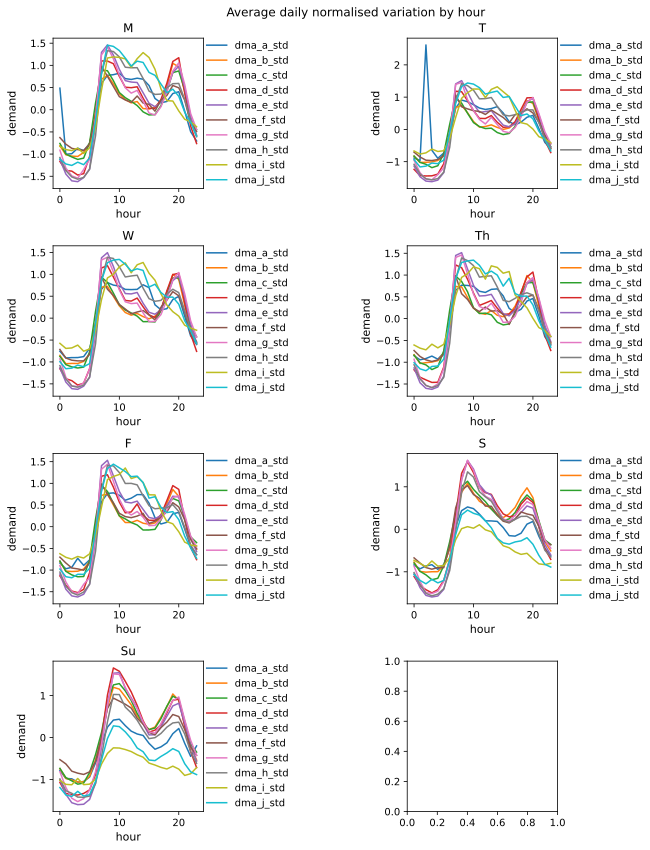

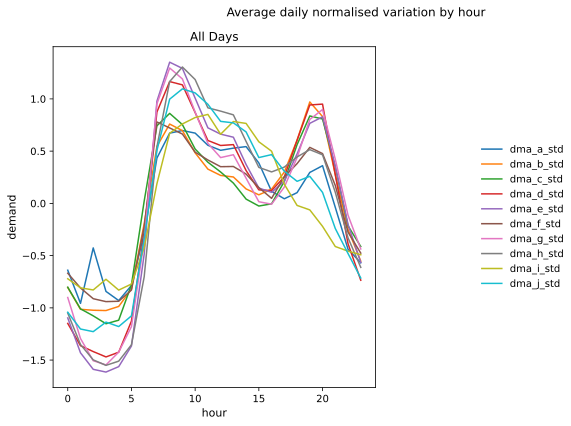

In [14]:
# similarity analysis between dmas
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from math import sqrt

# get standardised values
inflow_std = pd.DataFrame()
inflow_std.index = inflow_data.index

for dma in inflow_data.iloc[:, :10].columns: 
    
    # extract vals
    values = inflow_data[dma].values
    values = values.reshape((len(values), 1))

    # train the standardization
    scaler_std = StandardScaler()
    scaler_std = scaler_std.fit(values)
    print('Mean: %f, StandardDeviation: %f' % (scaler_std.mean_, sqrt(scaler_std.var_)))
    
    # transform
    standardized = scaler_std.transform(values)
    name = dma + '_std'
    inflow_std[name] = standardized.flatten()

inflow_std['hour'] = inflow_data['hour']
inflow_std['day'] = inflow_data['day']

# plot
fig, axs = plt.subplots(4, 2, figsize=(10, 12))
axs = axs.flatten()

fig.suptitle('Average daily normalised variation by hour', fontsize=12)

for day in np.arange(7):
    for dma in inflow_std.iloc[:, :10].columns: 
        axs[day].plot(inflow_std[inflow_std['day']==day].groupby(by='hour').mean()[dma], label=dma)
        axs[day].set_title(days[day])
        axs[day].set_xlabel('hour')
        axs[day].set_ylabel('demand')
        leg = axs[day].legend(loc='right', bbox_to_anchor=(1.6, 0.5),
            fancybox=False, shadow=False, ncol=1, edgecolor='w', borderpad=0)
        leg.get_frame().set_linewidth(0.5)

fig.tight_layout()
plt.show()

fig, axs = plt.subplots(1, 1, figsize=(10, 6))

fig.suptitle('Average daily normalised variation by hour', fontsize=12)

for dma in inflow_std.iloc[:, :10].columns: 
    axs.plot(inflow_std.groupby(by='hour').mean()[dma], label=dma)
    axs.set_title('All Days')
    axs.set_xlabel('hour')
    axs.set_ylabel('demand')
    leg = axs.legend(loc='right', bbox_to_anchor=(1.6, 0.5),
        fancybox=False, shadow=False, ncol=1, edgecolor='w', borderpad=0)
    leg.get_frame().set_linewidth(0.5)

fig.tight_layout()
plt.show()


#### 4. Stationarity

In [15]:
#Stationary Test
from statsmodels.tsa.stattools import adfuller

for dma in dmas: 
    adf,pvalue,usedlag_,nobs,critical_values,icbest = adfuller(inflow_data[dma])
    print(f"{dma}: pvalue = {pvalue:.3f}, if pvalue > 0.05, data is not stationary")
    #Results show stationary value


dma_a: pvalue = 0.000, if pvalue > 0.05, data is not stationary
dma_b: pvalue = 0.001, if pvalue > 0.05, data is not stationary
dma_c: pvalue = 0.000, if pvalue > 0.05, data is not stationary
dma_d: pvalue = 0.000, if pvalue > 0.05, data is not stationary
dma_e: pvalue = 0.000, if pvalue > 0.05, data is not stationary
dma_f: pvalue = 0.001, if pvalue > 0.05, data is not stationary
dma_g: pvalue = 0.001, if pvalue > 0.05, data is not stationary
dma_h: pvalue = 0.000, if pvalue > 0.05, data is not stationary
dma_i: pvalue = 0.000, if pvalue > 0.05, data is not stationary
dma_j: pvalue = 0.000, if pvalue > 0.05, data is not stationary


In [16]:
#Kolmogorow-Smirnov Test for Normality
from scipy.stats import kstest

for dma in dmas: 
    print(kstest(inflow_data[dma],'norm'))
#Results are normally distributed


KstestResult(statistic=0.9937847539876579, pvalue=0.0, statistic_location=2.709999999999999, statistic_sign=-1)
KstestResult(statistic=0.999999999819476, pvalue=0.0, statistic_location=6.27, statistic_sign=-1)
KstestResult(statistic=0.9716084941239296, pvalue=0.0, statistic_location=2.1, statistic_sign=-1)
KstestResult(statistic=1.0, pvalue=0.0, statistic_location=12.66, statistic_sign=-1)
KstestResult(statistic=1.0, pvalue=0.0, statistic_location=48.68, statistic_sign=-1)
KstestResult(statistic=0.9979793442767634, pvalue=0.0, statistic_location=3.0700000000000003, statistic_sign=-1)
KstestResult(statistic=0.9999999999999999, pvalue=0.0, statistic_location=8.25, statistic_sign=-1)
KstestResult(statistic=1.0, pvalue=0.0, statistic_location=9.36, statistic_sign=-1)
KstestResult(statistic=1.0, pvalue=0.0, statistic_location=13.48, statistic_sign=-1)
KstestResult(statistic=1.0, pvalue=0.0, statistic_location=13.729008, statistic_sign=-1)


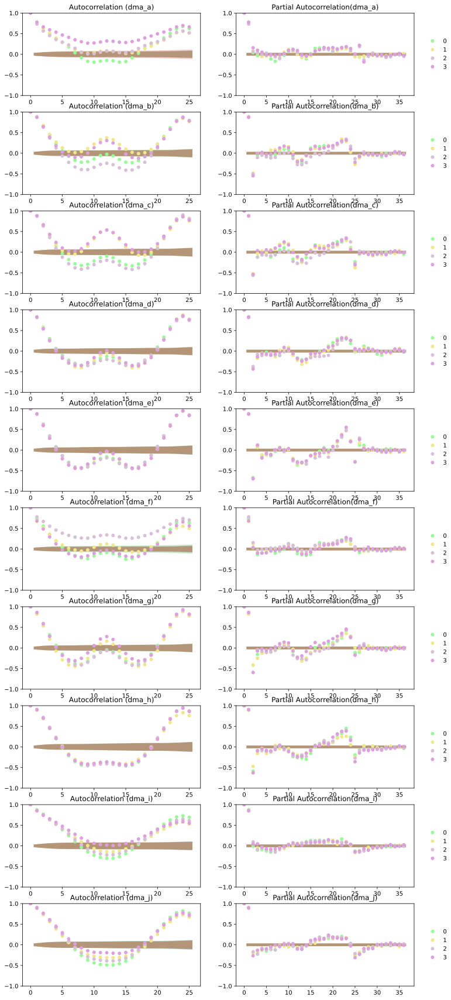

In [17]:
# AC and PAC
# testing to see if data can be treated as one entire dataset
# split data into quarters and compare pacf and acf for each

colors = [
    '#98FB98',  # PaleGreen
    '#F0E68C',  # Khaki
    '#D8BFD8',  # Thistle
    '#DDA0DD',  # Plum
    '#FFC0CB'   # Pink
]

fig, axs = plt.subplots(10, 2, figsize=(12, 30))

chunk_size = int(len(inflow_data)/4)
for i, dma in enumerate(dmas): 
    # split data into quarters
    for quarter in np.arange(4): 
        plot_acf(
            inflow_data[quarter*chunk_size:quarter*chunk_size+chunk_size][dma], 
            ax=axs[i][0], 
            lags=25, 
            use_vlines=False, 
            color=colors[quarter], 
            label=quarter, 
            title=f"Autocorrelation ({dma})"
        )
        
        plot_pacf(
            inflow_data[quarter*chunk_size:quarter*chunk_size+chunk_size][dma], 
            ax=axs[i][1], 
            use_vlines=False, 
            color=colors[quarter], 
            label=quarter,
            title=f"Partial Autocorrelation({dma})"
        )
    
    leg = axs[i][1].legend(loc='right', bbox_to_anchor=(1.2, 0.5),
        fancybox=False, shadow=False, ncol=1, edgecolor='w', borderpad=0)
    leg.get_frame().set_linewidth(0.5)

In [18]:
#QQ plot
import statsmodels.api as sm
import pylab as py

for dma in dmas: 
    sm.qqplot(df[dma],line='45')
    py.show()

#Results show not normally distributed

NameError: name 'df' is not defined

#### 4. Decomposition

In [ ]:
# seasonal decompositions
#
for dma in dmas: 
    ts_data_load = inflow_data[dma]
    decomposition = sm.tsa.seasonal_decompose(
        ts_data_load[-1000:], period=24, model="additive"
    )

    fig = decomposition.plot()


### Statistical Models

In [ ]:
# import
import datetime as dt
import math
import os
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from common.utils import load_data, mape
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.ar_model import AutoReg, ar_select_order


#### 1. Data Preparation

In [ ]:
# remove dupes
df_imputed = df_imputed[~df_imputed.index.duplicated(keep='first')]
weather_data = weather_data[~weather_data.index.duplicated(keep='first')]


#### 1.1 Transforms

In [ ]:
# find best boxcox transformation. Include datetime index if given
def boxcox_transform(df,lmda=None,alpha=None,optimizer=None):
    transform_df = df.copy()
    
    for col in df.columns:
        x = df[col]
        index = df.index
        
        if lmda == None:
            boxcox_data, lmda = boxcox(x, lmbda=None, alpha=None, optimizer=None)

        else:
            boxcox_data = boxcox(x, lmbda=lmda, alpha=None, optimizer=None)

        transform_df[col] = boxcox_data
        
    return transform_df

        
# reverse transformation. Include datetime index if given
def inv_boxcox_tranform(x, lmda, out=None):

    transform_df = df.copy()
    
    for col in df.columns:
        x = df[col]
        index = df.index
        
        if lmda == None:
            boxcox_data, lmda = inv_boxcox(x, lmbda=None, out=None)

        else:
            boxcox_data = inv_boxcox(x, lmbda=lmda, out=None)
        
        transform_df[col] = boxcox_data
        
    return transform_df
    

    
# min max transformation
def normalise(df): 
    
    norm_df = df.copy()
    
    for col in df.columns: 
        values = df[col].values
        values = values.reshape((len(values), 1))

        scaler = MinMaxScaler(feature_range=(0, 1))
        scaler = scaler.fit(values)
        
        normalised = scaler.transform(values)
        
        norm_df[col] = normalised
    
    return norm_df
     
    
# standardise transformation
def standardise(df): 
    
    stand_df = df.copy()
    
    for col in df.columns: 
        values = df[col].values
        values = values.reshape((len(values), 1))

        scaler = StandardScaler()
        scaler = scaler.fit(values)
        
        standardised = scaler.transform(values)
        
        stand_df[col] = standardised
    
    return stand_df
        

In [ ]:
# box cox transform
bc_inflow_data = boxcox_transform(inflow_data[dmas])

# comparison of initial data and transform
fig, axs = plt.subplots(5, 2, figsize=(8,24))
axs = axs.flatten()

for i, dma in enumerate(dmas): 
    
    # compare distributions of original and transformed data
    ax2 = axs[i].twiny()
    axs[i].set_title(dma)
    axs[i].hist(inflow_data[dma].values, density=True,bins=80,alpha=0.7)
    ax2.hist(bc_inflow_data[dma].values, density=True,bins=80, color='orange', alpha=0.7)
    
    # fit norm to original data
    # mean and standard deviation
    mu, std = norm.fit(inflow_data[dma].dropna(axis=0)) 
    
    # Plot the PDF
    xmin, xmax = inflow_data[dma].min(), inflow_data[dma].max()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)

    axs[i].plot(x, p, 'blue', linewidth=2)
    
    # fit norm to transformed data
    # mean and standard deviation
    mu, std = norm.fit(bc_inflow_data[dma].dropna(axis=0)) 
    
    # Plot the PDF
    xmin, xmax = bc_inflow_data[dma].min(), bc_inflow_data[dma].max()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)

    ax2.plot(x, p, 'orange', linewidth=2)
    
    axs[i].set_ylabel('Counts')
    axs[i].set_xlabel("L/s")
    ax2.set_xlabel("Transformed data", color='orange')

plt.show()
    

In [ ]:
# box cox transform
norm_inflow_data = normalise(inflow_data[dmas])
std_inflow_data = standardise(inflow_data[dmas])

# comparison of initial data and transform
fig, axs = plt.subplots(5, 2, figsize=(8,24))
axs = axs.flatten()

for i, dma in enumerate(dmas): 
    
    # compare distributions of original and transformed data
    axs[i].set_title(dma)
    axs[i].hist(std_inflow_data[dma].values, density=False,bins=40, color='orange', alpha=0.7)
    axs[i].hist(norm_inflow_data[dma].values, density=False,bins=40,alpha=0.7)
    
    """
    # fit norm to original data
    # mean and standard deviation
    mu, std = norm.fit(norm_inflow_data[dma].dropna(axis=0)) 
    
    # Plot the PDF
    xmin, xmax = norm_inflow_data[dma].min(), norm_inflow_data[dma].max()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)

    axs[i].plot(x, p, 'blue', linewidth=2)
    
    # fit norm to transformed data
    # mean and standard deviation
    mu, std = norm.fit(std_inflow_data[dma].dropna(axis=0)) 
    
    # Plot the PDF
    xmin, xmax = std_inflow_data[dma].min(), std_inflow_data[dma].max()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)

    ax2.plot(x, p, 'orange', linewidth=2)
    
    axs[i].set_ylabel('Counts')
    axs[i].set_xlabel("L/s")
    ax2.set_xlabel("Transformed data", color='orange')
    """

plt.show()


#### 1.2 Splitting data

In [ ]:
# splitting data
train_start_dt = "2022-04-01 00:00:00"
inflow_df = inflow_data[(inflow_data.index >= train_start_dt)].copy()

# percentage of data for each split
train_pc = 0.8
no_train = len(inflow_df) - 168 #int(train_pc * len(inflow_df))
test_pc = 0.2
no_test = 168 #int(test_pc * len(inflow_df))

train = inflow_df.iloc[0:no_train, :][dmas].copy()
test = inflow_df.iloc[no_train:no_train+no_test, :][dmas].copy()
print("Training data shape: ", train.shape)
print("Test data shape: ", test.shape)


#### 2. AutoRegressive Model

In [ ]:
# comparison of prediction and training data
fig, axs = plt.subplots(5, 2, figsize=(8,24))
axs = axs.flatten()

for i, dma in enumerate(dmas): 
    model = AutoReg(inflow_data[dma], 1)
    res = model.fit()
    res.plot_predict(no_train, no_train+no_test)
    print(f"{dma} results summary: ")
    print(results.summary())
    

In [ ]:
HORIZON = 1
print("Forecasting horizon:", HORIZON, "hours")

dma_dfs = {}

for dma in dmas: 
    test_shifted = test[[dma]].copy()
    for t in range(1, HORIZON):
        test_shifted[dma+'+'+str(t)] = test_shifted[dma].shift(-t, freq="H")
    
    test_shifted = test_shifted.dropna(how="any")
    dma_dfs[dma] = test_shifted
    
test_shifted.head(5)


In [ ]:
training_window = 24

# comparison of prediction and actual
fig, axs = plt.subplots(5, 2, figsize=(8,24))
axs = axs.flatten()
    
for i,dma in enumerate(['dma_a']): 
    train_ts = train[dma]
    test_ts = dma_dfs[dma]

    history = [x for x in train_ts]
    history = history[(-training_window):]

    predictions = list()

    # run autoreg model for each dma
    for t in range(test_ts.shape[0]):
        model = AutoReg(history, 1)
        model_fit = model.fit()
        yhat = model_fit.forecast(steps=3)
        predictions.append(yhat[0])
        obs = list(test_ts.iloc[t])
        history.append(obs[0])
        history.pop(0)
        
    axs[i].plot(train_ts[-training_window:], 'blue', linewidth=2, label='Observations')    
    axs[i].plot(test_ts.index, test_ts, 'blue', linewidth=2, label='Observations')
    axs[i].plot(test_ts.index, predictions, 'orange', linewidth=2, label='Predicted')
    axs[i].set_ylabel('demand')
    axs[i].set_xlabel("hours")
        
    leg = axs[i].legend(loc='right', bbox_to_anchor=(1.2, 0.5),
        fancybox=False, shadow=False, ncol=1, edgecolor='w', borderpad=0)
    leg.get_frame().set_linewidth(0.5)
    